<a href="https://www.kaggle.com/code/shravyalanka/image-inpainting?scriptVersionId=226508175" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [2]:
import numpy as np
import pandas as pd
import os, math, sys
import glob, itertools
import argparse, random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.models import vgg19
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image, make_grid

import plotly
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from PIL import Image
from tqdm import tqdm_notebook as tqdm
from sklearn.model_selection import train_test_split

random.seed(42)
import warnings
warnings.filterwarnings("ignore")

In [3]:
# load pretrained models
load_pretrained_models = False
# number of epochs of training
n_epochs = 12
# size of the batches
batch_size = 16
# name of the dataset
dataset_name = "../input/celeba-dataset/img_align_celeba/img_align_celeba"


# adam: learning rate
lr = 0.00008
# adam: decay of first order momentum of gradient
b1 = 0.5
# adam: decay of first order momentum of gradient
b2 = 0.999
# number of cpu threads to use during batch generation
n_cpu = 4
# dimensionality of the latent space
latent_dim = 100
# size of each image dimension
img_size = 128
# size of random mask
mask_size = 32
# number of image channels
channels = 3
# interval between image sampling
sample_interval = 500

cuda = True if torch.cuda.is_available() else False
os.makedirs("images", exist_ok=True)
os.makedirs("saved_models", exist_ok=True)

# Calculate output dims of image discriminator (PatchGAN)
patch_h, patch_w = int(mask_size / 2 ** 3), int(mask_size / 2 ** 3)
patch = (1, patch_h, patch_w)

In [4]:
print(mask_size)

32


In [5]:
class ImageDataset(Dataset):
    def __init__(self, root, transforms_=None, img_size=128, mask_size=mask_size, mode="train"):
        self.transform = transforms.Compose(transforms_)
        self.img_size = img_size
        self.mask_size = mask_size
        self.mode = mode
        self.files = sorted(glob.glob("%s/*.jpg" % root))
        self.files = self.files[:-4000] if mode == "train" else self.files[-4000:]


    def apply_random_mask(self, img):
        """Randomly masks image"""

        y1, x1 = np.random.randint(0, self.img_size - self.mask_size, 2)
        y2, x2 = y1 + self.mask_size, x1 + self.mask_size
        masked_part = img[:, y1:y2, x1:x2]
        masked_img = img.clone()
        masked_img[:, y1:y2, x1:x2] = 1

        return masked_img, masked_part

    def apply_center_mask(self, img):
        """Mask center part of image"""
        # Get upper-left pixel coordinate
        i = (self.img_size - self.mask_size) // 2
        masked_img = img.clone()
        masked_img[:, i : i + self.mask_size, i : i + self.mask_size] = 1
    
        return masked_img, i

    def __getitem__(self, index):

        img = Image.open(self.files[index % len(self.files)])
        img = self.transform(img)
        if self.mode == "train" or self.mode=="val":
            # For training data perform random mask
            masked_img, aux = self.apply_random_mask(img)
        else:
            # For test data mask the center of the image
            masked_img, aux = self.apply_center_mask(img)

        return img, masked_img, aux

    def __len__(self):
        return len(self.files)

In [6]:
class GrayscaleTo3Channels(object):
    def __init__(self):
        pass

    def __call__(self, img):
        # If the image is grayscale ('L'), convert to 3 channels (RGB)
        if img.mode == 'L':
            img = img.convert('RGB')
        return img



transforms_ = [
    transforms.Resize((img_size, img_size), Image.BICUBIC),
    GrayscaleTo3Channels(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]
# Training dataloader
dataloader = DataLoader(
    ImageDataset(dataset_name, transforms_=transforms_),
    batch_size=batch_size,
    shuffle=True,
    num_workers=n_cpu,
)

# Validation dataloader
val_dataloader = DataLoader(
    ImageDataset(dataset_name, transforms_=transforms_, mode="val"),
    batch_size=batch_size,  # Keep same batch size as training or adjust as needed
    shuffle=False,  # No need to shuffle validation data
    num_workers=n_cpu,  # Use same workers as training for efficiency
)

# Test dataloader (if needed separately)
test_dataloader = DataLoader(
    ImageDataset(dataset_name, transforms_=transforms_, mode="test"),
    batch_size=12,  # Different batch size for testing
    shuffle=False,
    num_workers=1,
)


In [7]:
img, masked_imgs, aux = next(iter(dataloader))
img.shape, masked_imgs.shape, aux.shape

(torch.Size([16, 3, 128, 128]),
 torch.Size([16, 3, 128, 128]),
 torch.Size([16, 3, 32, 32]))

In [8]:
class Generator(nn.Module):
    def __init__(self, channels=3):
        super(Generator, self).__init__()

        def downsample(in_feat, out_feat, normalize=True):
            layers = [nn.Conv2d(in_feat, out_feat, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.BatchNorm2d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        def upsample(in_feat, out_feat, normalize=True):
            layers = [nn.ConvTranspose2d(in_feat, out_feat, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.BatchNorm2d(out_feat, 0.8))
            layers.append(nn.ReLU(inplace=True))
            return layers

        self.encoder = nn.Sequential(
            *downsample(channels, 64, normalize=False),  # 128x128 → 64x64
            *downsample(64, 128),  # 64x64 → 32x32
            *downsample(128, 256),  # 32x32 → 16x16
            *downsample(256, 512),  # 16x16 → 8x8
            *downsample(512, 512),  # 8x8 → 4x4
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 512, 3, 1, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, 1, 1),
            nn.ReLU(inplace=True),
        )

        self.decoder = nn.Sequential(
            *upsample(512, 512),  # 4x4 → 8x8
            *upsample(512, 256),  # 8x8 → 16x16
            *upsample(256, 128),  # 16x16 → 32x32
            nn.Conv2d(128, channels, 3, 1, 1),  # 32x32 output
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.bottleneck(x)
        x = self.decoder(x)
        return x




class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, stride, normalize=True):
            """Returns layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride, 1)]  # Kernel 4x4
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
        *discriminator_block(channels, 64, stride=2, normalize=False),  # 128x128 -> 64x64
        *discriminator_block(64, 128, stride=2),  # 64x64 -> 32x32
        *discriminator_block(128, 256, stride=2),  # 32x32 -> 16x16
        *discriminator_block(256, 512, stride=2),  # 16x16 -> 8x8
        *discriminator_block(512, 512, stride=1, normalize=False),  # ❌ Disable normalization here
        nn.Conv2d(512, 2, kernel_size=3, stride=1, padding=1)  # Final 8x8 validity map
    )


    def forward(self, img):
        return self.model(img)  # Output shape: (batch_size, 1, 8, 8)


In [9]:
#Visulation function for 1 image 
def vis(idx, img, masked_imgs, aux):
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(15, 10)

    a = img[idx].cpu().detach().numpy()
    a = np.transpose(a, (1, 2, 0))
    ax[0].imshow(a)
    ax[0].set_title("The Original Image")

    ax[1].imshow(np.transpose(masked_imgs[idx].cpu().detach().numpy(), (1, 2, 0)))
    ax[1].set_title("The Masked Image")

    ax[2].imshow(np.transpose(aux[idx].cpu().detach().numpy(), (1, 2, 0)))
    ax[2].set_title("Mask Image")

    plt.show()


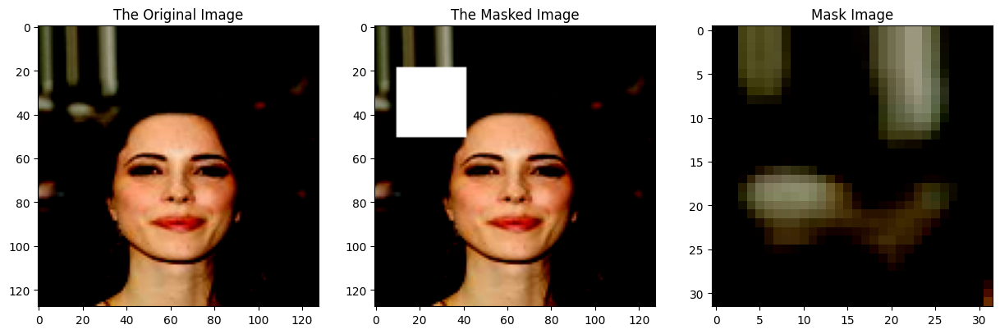

In [10]:

vis(0, img, masked_imgs, aux)

In [11]:
cuda = True if torch.cuda.is_available() else False
os.makedirs("images", exist_ok=True)
os.makedirs("saved_models", exist_ok=True)

#(PatchGAN)
patch_h, patch_w = int(mask_size / 2 ** 3), int(mask_size / 2 ** 3)
patch = (1, patch_h, patch_w)

In [12]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

def save_sample(batches_done):
    samples, masked_samples, i = next(iter(test_dataloader))
    samples = Variable(samples.type(Tensor))
    masked_samples = Variable(masked_samples.type(Tensor))
    i = i[0].item()  # Upper-left coordinate of mask
    # Generate inpainted image
    gen_mask = generator(masked_samples)
    filled_samples = masked_samples.clone()
    filled_samples[:, :, i : i + mask_size, i : i + mask_size] = gen_mask
    # Save sample
    sample = torch.cat((masked_samples.data, filled_samples.data, samples.data), -2)
    save_image(sample, "images/%d.png" % batches_done, nrow=6, normalize=True)

    
# Loss function
adversarial_loss = torch.nn.MSELoss()
pixelwise_loss = torch.nn.L1Loss()

# Initialize generator and discriminator
generator = Generator(channels=channels)

discriminator = Discriminator(channels=channels)

# Load pretrained models
if load_pretrained_models:
    generator.load_state_dict(torch.load("/kaggle/working/saved_models/generator.pth"))
    discriminator.load_state_dict(torch.load("/kaggle/working/saved_models/discriminator.pth"))

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()
    pixelwise_loss.cuda()

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

In [13]:
print(generator)

Generator(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (12): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyR

In [14]:
print(discriminator)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (12): LeakyReLU(negative_slope=0.2, inplace=True)
    (13): Conv2d(512, 2, ker

In [15]:
gen_adv_losses, gen_pixel_losses, disc_losses, counter = [], [], [], []
val_gen_adv_losses, val_gen_pixel_losses, val_disc_losses = [], [], []

for epoch in range(n_epochs):
    
    ### Training ###
    gen_adv_loss, gen_pixel_loss, disc_loss = 0, 0, 0
    tqdm_bar = tqdm(dataloader, desc=f'Training Epoch {epoch}', total=len(dataloader))
    
    for i, (imgs, masked_imgs, masked_parts) in enumerate(tqdm_bar):
        # Adversarial ground truths
        imgs = Variable(imgs.type(Tensor))
        masked_imgs = Variable(masked_imgs.type(Tensor))
        masked_parts = Variable(masked_parts.type(Tensor))
        gen_parts = generator(masked_imgs)
        valid = Variable(Tensor(*discriminator(gen_parts).shape).fill_(1.0), requires_grad=False)
        fake = Variable(Tensor(*discriminator(gen_parts).shape).fill_(0.0), requires_grad=False)

        # Configure input
        

        ## Train Generator ##
        optimizer_G.zero_grad()

        # Generate a batch of images
        

        


        # Adversarial and pixelwise loss
        
        g_adv = adversarial_loss(discriminator(gen_parts), valid)
        g_pixel = pixelwise_loss(gen_parts, masked_parts)
        g_loss = 0.1 * g_adv + 0.9 * g_pixel

        g_loss.backward()
        optimizer_G.step()

        ## Train Discriminator ##
        optimizer_D.zero_grad()

        real_loss = adversarial_loss(discriminator(masked_parts), valid)
        fake_loss = adversarial_loss(discriminator(gen_parts.detach()), fake)
        d_loss = 0.5 * (real_loss + fake_loss)

        d_loss.backward()
        optimizer_D.step()

       

        gen_adv_loss += g_adv.item()
        gen_pixel_loss += g_pixel.item()
        disc_loss += d_loss.item()

        gen_adv_losses.append(g_adv.item())
        gen_pixel_losses.append(g_pixel.item())
        disc_losses.append(d_loss.item())

        counter.append(i * batch_size + imgs.size(0) + epoch * len(dataloader.dataset))

        tqdm_bar.set_postfix(gen_adv_loss=gen_adv_loss/(i+1), gen_pixel_loss=gen_pixel_loss/(i+1), disc_loss=disc_loss/(i+1))

        # Generate sample at sample interval
        batches_done = epoch * len(dataloader) + i
        if batches_done % sample_interval == 0:
            save_sample(batches_done)
    
    ### Validation ###
    val_gen_adv_loss, val_gen_pixel_loss, val_disc_loss = 0, 0, 0
    with torch.no_grad():
        val_tqdm_bar = tqdm(val_dataloader, desc=f'Validation Epoch {epoch}', total=len(val_dataloader))
        for i, (imgs, masked_imgs, masked_parts) in enumerate(val_tqdm_bar):
            valid = Variable(Tensor(imgs.shape[0], *patch).fill_(1.0), requires_grad=False)
            fake = Variable(Tensor(imgs.shape[0], *patch).fill_(0.0), requires_grad=False)

            imgs = Variable(imgs.type(Tensor))
            masked_imgs = Variable(masked_imgs.type(Tensor))
            masked_parts = Variable(masked_parts.type(Tensor))

            # Generate images
            gen_parts = generator(masked_imgs)

            # Compute validation losses
            g_adv = adversarial_loss(discriminator(gen_parts), valid)
            g_pixel = pixelwise_loss(gen_parts, masked_parts)
            g_loss = 0.1 * g_adv + 0.9 * g_pixel

            real_loss = adversarial_loss(discriminator(masked_parts), valid)
            fake_loss = adversarial_loss(discriminator(gen_parts), fake)
            d_loss = 0.5 * (real_loss + fake_loss)

            val_gen_adv_loss += g_adv.item()
            val_gen_pixel_loss += g_pixel.item()
            val_disc_loss += d_loss.item()

            val_gen_adv_losses.append(g_adv.item())
            val_gen_pixel_losses.append(g_pixel.item())
            val_disc_losses.append(d_loss.item())

            val_tqdm_bar.set_postfix(
                val_gen_adv_loss=val_gen_adv_loss/(i+1),
                val_gen_pixel_loss=val_gen_pixel_loss/(i+1),
                val_disc_loss=val_disc_loss/(i+1)
            )

    # Save model checkpoints
    torch.save(generator.state_dict(), "/kaggle/working/saved_models/generator.pth")
    torch.save(discriminator.state_dict(), "/kaggle/working/saved_models/discriminator.pth")

Training Epoch 0:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 0:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 1:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 1:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 2:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 2:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 3:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 3:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 4:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 4:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 5:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 5:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 6:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 6:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 7:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 7:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 8:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 8:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 9:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 9:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 10:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 10:   0%|          | 0/250 [00:00<?, ?it/s]

Training Epoch 11:   0%|          | 0/12413 [00:00<?, ?it/s]

Validation Epoch 11:   0%|          | 0/250 [00:00<?, ?it/s]

In [16]:
!ls -al /kaggle/working/saved_models

total 99496
drwxr-xr-x 2 root root     4096 Mar  8 14:55 .
drwxr-xr-x 5 root root     4096 Mar  8 14:55 ..
-rw-r--r-- 1 root root 27847058 Mar  8 17:36 discriminator.pth
-rw-r--r-- 1 root root 74020005 Mar  8 17:36 generator.pth


In [17]:
import plotly.io as pio
pio.renderers.default = "notebook"  # or "colab"


In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=counter, y=gen_pixel_losses, mode='lines', name='Gen Pixel Loss', marker_color='orange'))
fig.add_trace(go.Scatter(x=counter, y=disc_losses, mode='lines', name='Discriminator Loss', marker_color='seagreen'))
fig.show()

In [19]:
imgs, masked_imgs, aux = next(iter(test_dataloader))
g = generator(masked_imgs.type(Tensor))


In [20]:
print(len(test_dataloader.dataset))

4000


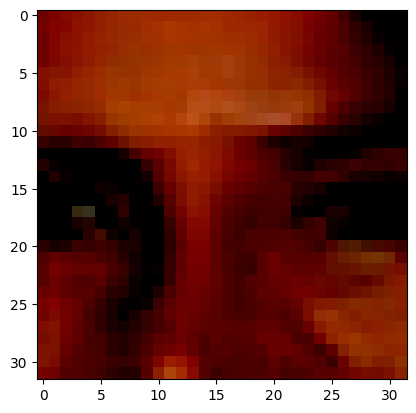

In [21]:
img_temp = g.cpu().detach().numpy()
img_temp = np.transpose(img_temp[0], (1, 2, 0))
plt.imshow(img_temp)

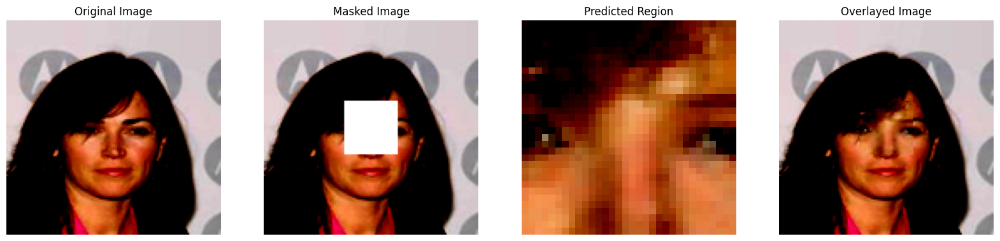

In [22]:
def vis(idx):
    fig, ax = plt.subplots(1, 4, figsize=(20, 10))

    # Original image
    original_image = imgs[idx].cpu().detach().numpy()
    original_image = np.transpose(original_image, (1, 2, 0))
    ax[0].imshow(original_image)
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    # Masked image
    masked_image = masked_imgs[idx].cpu().detach().numpy()
    masked_image = np.transpose(masked_image, (1, 2, 0))
    ax[1].imshow(masked_image)
    ax[1].set_title("Masked Image")
    ax[1].axis('off')

    # Predicted region
    predicted_mask = g[idx].cpu().detach().numpy()
    predicted_mask = np.transpose(predicted_mask, (1, 2, 0))
    ax[2].imshow(predicted_mask)
    ax[2].set_title("Predicted Region")
    ax[2].axis('off')

    # Overlay predicted region onto the masked image
    overlay_image = masked_image.copy()
    i = (img_size - mask_size) // 2  # Center mask calculation
    overlay_image[i:i + mask_size, i:i + mask_size, :] = predicted_mask
    ax[3].imshow(overlay_image)
    ax[3].set_title("Overlayed Image")
    ax[3].axis('off')

    plt.show()


# Visualize results for a specific index
vis(1)

In [23]:
'''adv_losses, gen_pixel_losses, disc_losses, counter = [], [], [], []
generator.load_state_dict(torch.load("/kaggle/working/saved_models/generator.pth"))
discriminator.load_state_dict(torch.load("/kaggle/working/saved_models/discriminator.pth"))

generator.eval()
discriminator.eval()   




    ### Testing ###
gen_adv_loss, gen_pixel_loss, disc_loss = 0, 0, 0
tqdm_bar = tqdm(test_dataloader, desc=f'Testing' , total=int(len(test_dataloader)))
for i, (imgs, masked_imgs, mp) in enumerate(tqdm_bar):

    mp=mp[0].item();
    
    #print(imgs.shape, masked_imgs.shape, masked_parts.shape)
    # Adversarial ground truths
    valid = Variable(Tensor(imgs.shape[0], *patch).fill_(1.0), requires_grad=False)
    fake = Variable(Tensor(imgs.shape[0], *patch).fill_(0.0), requires_grad=False)

    # Configure input
    imgs = Variable(imgs.type(Tensor))
    masked_imgs = Variable(masked_imgs.type(Tensor))


    # Generate a batch of images
    gen_parts = generator(masked_imgs)
    masked_parts = masked_imgs[:, :, mp : mp + mask_size, mp : mp + mask_size]
    #masked_parts[:, :, mp : mp + mask_size, mp : mp + mask_size] = gen_parts

    
    #print(f"gen_parts shape: {gen_parts.shape}")
    #print(f"masked_parts shape: {masked_parts.shape}")


    # Adversarial and pixelwise loss
    g_adv = adversarial_loss(discriminator(gen_parts), valid)
    g_pixel = pixelwise_loss(gen_parts, masked_parts)
    # Total loss
    g_loss = 0.001 * g_adv + 0.999 * g_pixel

    
    # Measure discriminator's ability to classify real from generated samples
    real_loss = adversarial_loss(discriminator(masked_parts), valid)
    fake_loss = adversarial_loss(discriminator(gen_parts.detach()), fake)
    d_loss = 0.5 * (real_loss + fake_loss)

        
    gen_adv_loss, gen_pixel_loss, disc_loss
    gen_adv_losses, gen_pixel_losses, disc_losses, counter
    
    gen_adv_loss += g_adv.item()
    gen_pixel_loss += g_pixel.item()
    gen_adv_losses.append(g_adv.item())
    gen_pixel_losses.append(g_pixel.item())
    disc_loss += d_loss.item()
    disc_losses.append(d_loss.item())
    counter.append(i*12 + imgs.size(0) + len(test_dataloader.dataset))
    tqdm_bar.set_postfix(gen_adv_loss=gen_adv_loss/(i+1), gen_pixel_loss=gen_pixel_loss/(i+1), disc_loss=disc_loss/(i+1))
    
    # Generate sample at sample interval
    batches_done =  len(test_dataloader) + i
    if batches_done % sample_interval == 0:
        save_sample(batches_done)
        '''


'adv_losses, gen_pixel_losses, disc_losses, counter = [], [], [], []\ngenerator.load_state_dict(torch.load("/kaggle/working/saved_models/generator.pth"))\ndiscriminator.load_state_dict(torch.load("/kaggle/working/saved_models/discriminator.pth"))\n\ngenerator.eval()\ndiscriminator.eval()   \n\n\n\n\n    ### Testing ###\ngen_adv_loss, gen_pixel_loss, disc_loss = 0, 0, 0\ntqdm_bar = tqdm(test_dataloader, desc=f\'Testing\' , total=int(len(test_dataloader)))\nfor i, (imgs, masked_imgs, mp) in enumerate(tqdm_bar):\n\n    mp=mp[0].item();\n    \n    #print(imgs.shape, masked_imgs.shape, masked_parts.shape)\n    # Adversarial ground truths\n    valid = Variable(Tensor(imgs.shape[0], *patch).fill_(1.0), requires_grad=False)\n    fake = Variable(Tensor(imgs.shape[0], *patch).fill_(0.0), requires_grad=False)\n\n    # Configure input\n    imgs = Variable(imgs.type(Tensor))\n    masked_imgs = Variable(masked_imgs.type(Tensor))\n\n\n    # Generate a batch of images\n    gen_parts = generator(masked

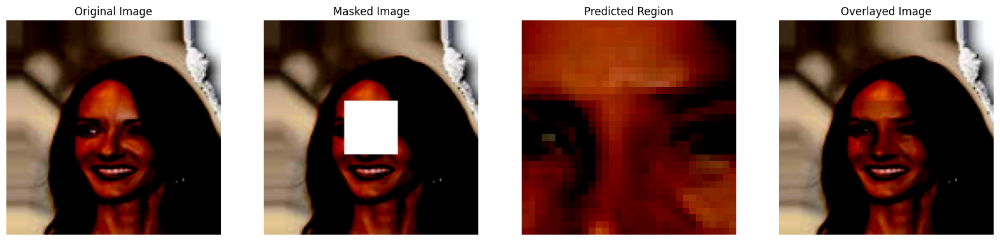

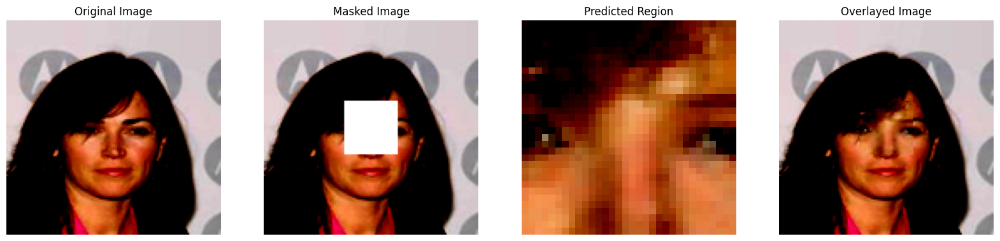

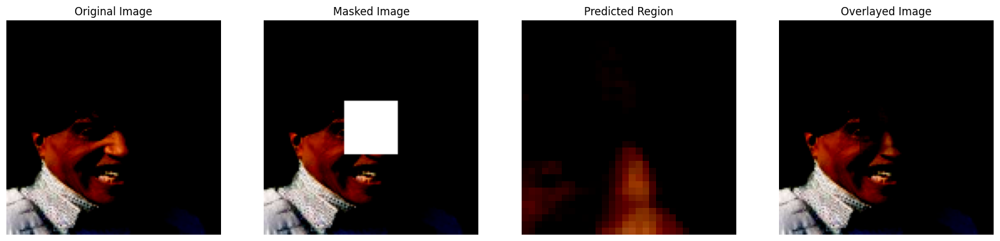

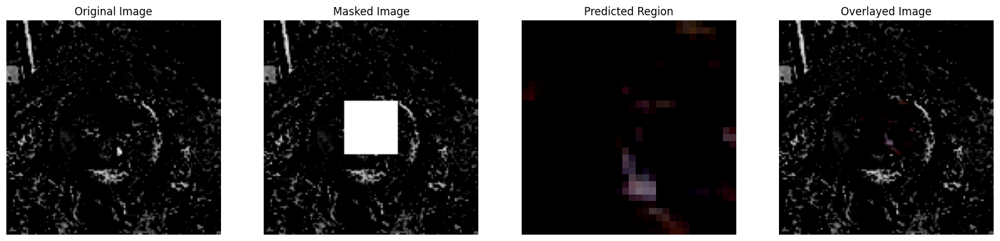

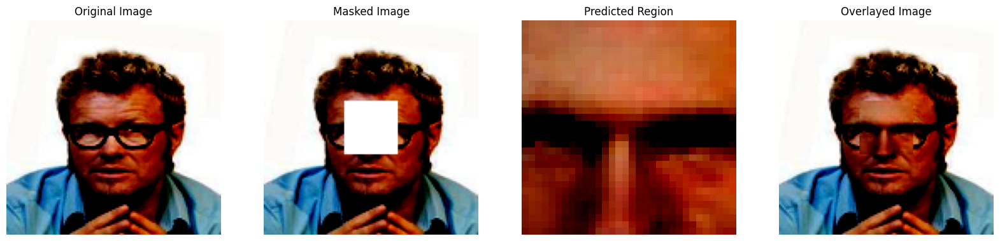

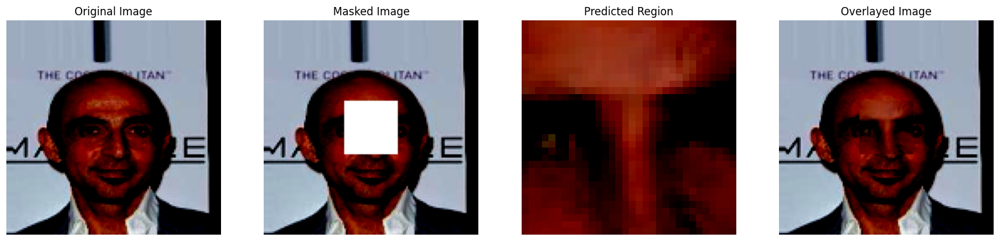

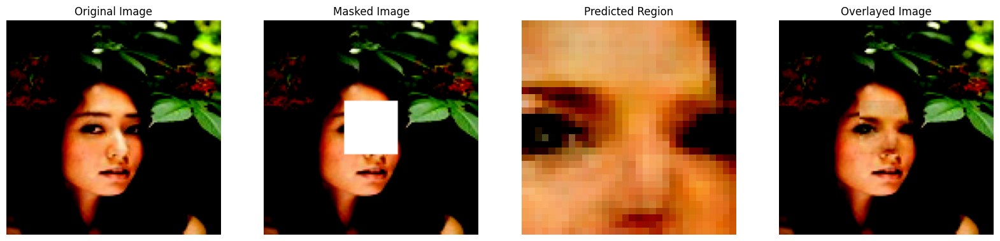

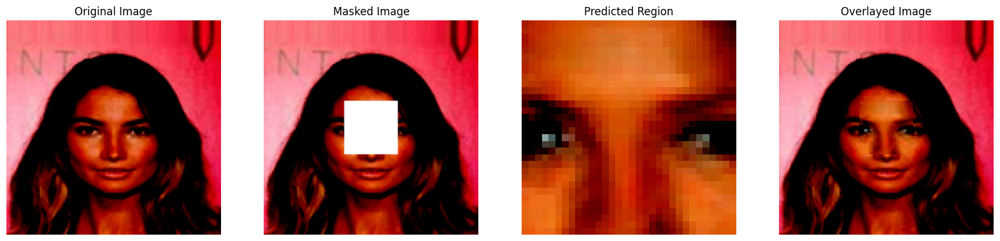

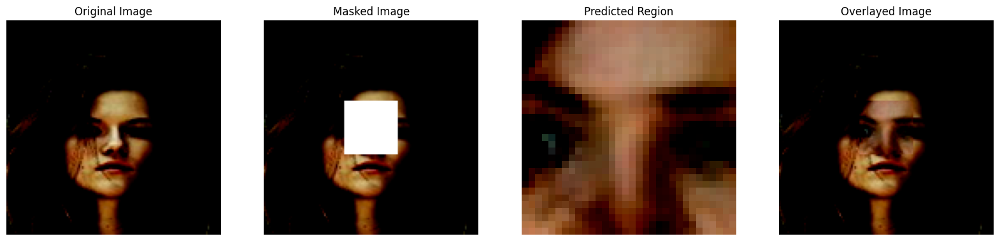

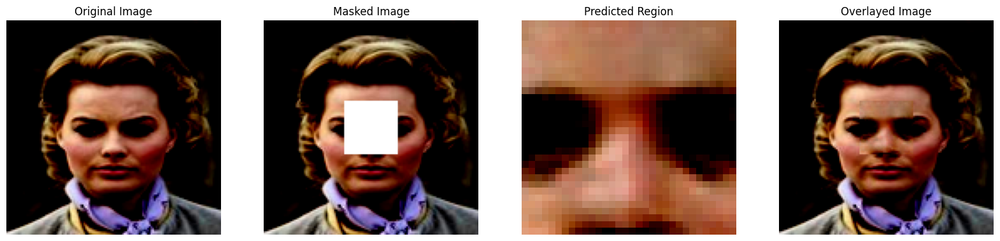

In [24]:
final_imgs, final_masked_imgs, final_g = [], [], []
with torch.no_grad():
    for i, (imgs, masked_imgs, mp) in enumerate(test_dataloader):
        mp = mp[0].item()
        
        imgs = Variable(imgs.type(Tensor))
        masked_imgs = Variable(masked_imgs.type(Tensor))
        gen_parts = generator(masked_imgs)
    
        final_imgs.append(imgs)
        final_masked_imgs.append(masked_imgs)
        final_g.append(gen_parts)

# Convert list to tensors
imgs = torch.cat(final_imgs, dim=0)
masked_imgs = torch.cat(final_masked_imgs, dim=0)
g = torch.cat(final_g, dim=0)

# Now call visualization
for i in range(0, 10):
    vis(i)
